# Reproducing Gunseli CDA Study (2019)
## Pipeline for all files

Note: No cleaning, no trial nor subject removal. All data is taken/used.
Note: They average differently in their study. They average all good contra trials over electrode and then substract contra - ipsi. I substract electrodes and then average over trials.  

In [33]:
import numpy as np
import pandas as pd
import glob
import pickle

import mne
from mne import Epochs, pick_channels, find_events
from mne.io import read_raw_eeglab

from scipy.io import loadmat

import os
import sys
#sys.path.append('/Users/nick/Documents/PhD/CLCT/reprod/studies/Hakim-2019/')
#from events import get_specific_events#, checksum_epochs

import matplotlib.pyplot as plt
%matplotlib inline


def get_key(d, val):
    for k in d.keys():
        for t in d[k]:
            if t == val:
                return k

    return None

def get_keys(d, val, conds, sides):
    size = None
    side = None

    for s in sides:
        for t in d[s]:
            if t == val:
                side = s

    for s in conds:
        for t in d[s]:
            if t == val:
                size = s

    return size, side


## 1. Prep Data

In [35]:
#==================================================================
# General Variables
#==================================================================
# Organize Triggers
triggers = dict();


# CDA Channels
chan_right = ['PO8'] #['P8', 'PO8', 'O2']
chan_left = ['PO7'] #['P7', 'PO7', 'O1']

# CDA main variable!
cda_dict = dict()

#==================================================================
# Main Loop - Loading All Files & Extract CDAs.
#==================================================================
#folderpath = 'D:\\CLNT\\Open Datasets\\Gunseli 2019\\'
#filepath = folderpath + 'raw data files\\' + 'StratAtt_e2_LoadChans_pp2.set'

folderpath = '/Users/nick/Documents/PhD/CDA Datasets/Gunseli 2019/'
filepath = folderpath + 'raw data files/' + 'StratAtt_e2_LoadChans_pp2.set'

#for filepath in glob.iglob(folderpath + 'raw data files\\' + '*.set'):
file_name = filepath[filepath.rfind('/')+1:]
print('Processing: ' + file_name + '...')

# 1. -- Load File --
raw = read_raw_eeglab(filepath, preload=True)

print(raw.info.ch_names)

# Resample
preproc = raw.resample(500)

# 2. -- General Preprocess --
# Keep only EEG channels and reference
#raw = raw.set_eeg_reference(ref_channels=['EXG7', 'EXG8'])

# Set Electrodes Locations
#montage = mne.channels.make_standard_montage('biosemi64')
#raw.set_montage(montage)

# Filter
preproc = preproc.filter(.1, 20., fir_design='firwin')

# Get events
events = mne.events_from_annotations(preproc)
#preproc.plot(events=events, block=True, lowpass=40)

# 3. -- Epochs --
#====================================
# 1. Find 'clean' trials and sort them by triggers.
# 2. Load Behav file to get ACC (accuracy: good/bad trials)
# 3. Epochs
# 4. Remove Baseline
#====================================

behavfilepath = folderpath + 'raw data files/' + 'subject-{}.csv'.format(filepath[filepath.rfind('pp')+2:filepath.rfind('.')])

behav = pd.read_csv(behavfilepath)  
behav_hl = behav['block_type'][(behav['block_type'] == 'low') | (behav['block_type'] == 'high')]

# -----
memCodes = [5, 6]
cueCodes = [10, 20, 30]
finalCodes = [15,16,25,26]
allCodes = []
for m in memCodes:
    for c in cueCodes:
        allCodes.append(c + m)

relevantTriggers = [events[1]['10'], events[1]['20'], events[1]['30']]
trigger_id = relevantTriggers
answer_id_good = [5,6]
new_id = 44
fill_na = 99
sfreq = 500
tmin = -1.5
tmax = 0

nbTrials = 0
nbFinalTrials = 0
triggers_answers = dict()
for c in allCodes:
    new_trigger_good, lag_temp_good = mne.event.define_target_events(events[0], events[1][str(int(c / 10) * 10)], int(c % 10), sfreq, tmin, tmax, c, fill_na)

    good = np.array(new_trigger_good)
    good = good[good[:,2] == (c)]

    print('Code {}: {} (fill na), {} (c)'.format(c, len(new_trigger_good[new_trigger_good[:,2] == fill_na]), len(new_trigger_good[new_trigger_good[:,2] == c])))

    triggers_answers[c] = good

    nbTrials += len(triggers_answers[c])
    if c in finalCodes:
        nbFinalTrials += len(triggers_answers[c])

print('Total of {} trials with {} of {}'.format(nbTrials, nbFinalTrials, finalCodes))

Processing: StratAtt_e2_LoadChans_pp2.set...
Reading /Users/nick/Documents/PhD/CDA Datasets/Gunseli 2019/raw data files/StratAtt_e2_LoadChans_pp2.fdt
Reading 0 ... 2452479  =      0.000 ...  4789.998 secs...


/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_37769/2835050494.py:29: RuntimeWarning: Not setting positions of 4 eog channels found in montage:
['VEOGsT', 'VEOGsB', 'HEOGsL', 'HEOGsR']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_eeglab(filepath, preload=True)


['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'VEOGsT', 'VEOGsB', 'HEOGsL', 'HEOGsR']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 1650

In [1]:
epoch_length = 1.5
epoch_tmin = -0.5
baseline_corr = (-0.2, 0)

epochs_dict = dict()

for trigger in triggers_answers.keys():
    print('---------- ' + str(trigger) + ' -------------')

    epochs_dict[trigger] = dict()
    if(len(triggers_answers[trigger]) > 0):
        t_ids_good = np.unique(np.array(triggers_answers[trigger])[:,2]).tolist()
        epochs_dict[trigger] = Epochs(preproc, triggers_answers[trigger], t_ids_good, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True)
    else:
        epochs_dict[trigger] = None

NameError: name 'triggers_answers' is not defined

In [13]:
events = mne.events_from_annotations(preproc)
print(events[1])

print(set(events[0][:,2]))

Used Annotations descriptions: ['1', '10', '20', '30', '5', '6']
{'1': 1, '10': 2, '20': 3, '30': 4, '5': 5, '6': 6}
{1, 2, 3, 4, 5, 6}


In [17]:
# importing the module
import collections

total = 0

events = mne.events_from_annotations(preproc)
events = events[0]
frequency = collections.Counter(events[:,2])
events_frequency = dict(frequency)

for c in set(events[:,2]):
#    for t in triggers[c]:
    cond_total = events_frequency[c]
    total = total + cond_total
    print("{} :\t{}".format(c, cond_total))

print("--------------------")
print("Total: \t{}".format(total))

Used Annotations descriptions: ['1', '10', '20', '30', '5', '6']
1 :	520
2 :	180
3 :	159
4 :	181
5 :	250
6 :	250
--------------------
Total: 	1540


In [9]:
for cur_cond in conds:
    l1 = len(specific_events[cur_cond]['left']['good'])
    l2 = len(specific_events[cur_cond]['left']['bad'])
    l3 = len(specific_events[cur_cond]['right']['good'])
    l4 = len(specific_events[cur_cond]['right']['bad'])
    print("{}: {} + {} + {} + {} = {}".format(cur_cond, l1,l2,l3,l4, l1+l2+l3+l4))

2: 169 + 31 + 184 + 16 = 400
4: 138 + 62 + 131 + 69 = 400


In [18]:
import os  
#path="/Users/nick/Documents/PhD/CDA Datasets/Exp1a/EEGData/4"
path='/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/4/4_WM_att_NHKA.vhdr'
if os.path.isdir(path):  
    print("\nIt is a directory")  
elif os.path.isfile(path):  
    print("\nIt is a normal file")  
else:  
    print("It is a special file (socket, FIFO, device file)" )
print()


It is a normal file



# Epoching + Checksum

In [ ]:
epoch_length = 1.4
epoch_tmin = -0.4
baseline_corr = (-0.4, 0)

epochs_dict = dict()

print("====================== EPOCHING ======================")
print("tmin:{}, tmax:{}, baseline={}".format(epoch_tmin, epoch_length, baseline_corr))

epochs_dict = dict()
for cur_cond in specific_events.keys():
    epochs_dict[cur_cond] = dict()

    for cur_side in specific_events[cur_cond].keys():
        epochs_dict[cur_cond][cur_side] = dict()

        for cur_perf in specific_events[cur_cond][cur_side].keys():
            print('---------- {}-{}-{} -------------'.format(cur_cond, cur_side, cur_perf))

            if(len(specific_events[cur_cond][cur_side][cur_perf]) > 0):
                epochs_dict[cur_cond][cur_side][cur_perf] = Epochs(preproc, specific_events[cur_cond][cur_side][cur_perf], tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')
            else:
                epochs_dict[cur_cond][cur_side][cur_perf] = None
print("====================== /EPOCHING ======================")

In [ ]:
for path, directories, files in os.walk('/Users/nick/Documents/PhD/CDA Datasets/Exp1a/EEGData', followlinks=True, topdown=True):
    print (path)
    print (directories)
    print (files)
    print ('--------------------------------')

In [20]:
for path, directories, files in os.walk('/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData', followlinks=True, topdown=True):
    print (path)
    print (directories)
    print (files)
    print ('--------------------------------')
    #for file in files:
    #    path, directories, files in os.walk('/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData', followlinks=True, topdown=True):
        

/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData
[]
['10', '11', '12', '13', '15', '16', '17', '18', '20', '21', '22', '23', '24', '25', '28', '29', '31', '34', '35', '36', '38', '39', '4', '42', '5', '6', '7', '9']


AttributeError: module 'os' has no attribute 'joint'

In [ ]:
#====================================
# Checksum -- Triggers vs Epochs 
# (all triggers should be an epoch!)
#====================================

print("====================================")
print("Verifying Checksum...")

if len(specific_events) != len(epochs_dict):
    print("## CHECKSUM FAIL - DIFF LENGTHS ##")

checksum = 1

for cond in specific_events.keys():
    for side in specific_events[cond].keys():
        for perf in specific_events[cond][side].keys():
            if len(specific_events[cond][side][perf]) != len(epochs_dict[cond][side][perf]):
                print("## CHECKSUM FAIL: {}-{}-{} ##".format(cond, side, perf))
                checksum = 0
                
if(checksum == 1):
    print("All Good! Moving Forward.")

print("====================================")

#====================================
# Report
#====================================

print("====================================")
print("------------- REPORT ---------------")

for cond in epochs_dict.keys():
    str_message = ""
    good_both_sides = 0
    bad_both_sides = 0
    for side in sides:
        if epochs_dict[cond][side]['good'] is not None:
            nb_goods = len(epochs_dict[cond][side]['good'])
        else:
            nb_goods = 0

        if epochs_dict[cond][side]['bad'] is not None:
            nb_bads = len(epochs_dict[cond][side]['bad'])
        else:
            nb_bads = 0

        str_message = str_message + '\t{}-{}: {} Trials ({} (G) / {} (B))\n'.format(cond, side, nb_goods+nb_bads, nb_goods, nb_bads)
        good_both_sides = good_both_sides + nb_goods
        bad_both_sides = bad_both_sides + nb_bads
    
    print('{}: {} Trials ({} (G) / {} (B))'.format(cond, bad_both_sides + good_both_sides, good_both_sides, bad_both_sides))
    print(str_message)
print("====================================")


In [21]:
l = ['10_WM_att_NHKA.vhdr', '11_WM_att_NHKA.vhdr', '12_WM_att_NHKA.vhdr', '13_WM_att_NHKA.vhdr', '15_WM_att_NHKA.vhdr', '16_WM_att_NHKA.vhdr', '17_WM_att_NHKA.vhdr', '18_WM_att_NHKA.vhdr', '20_WM_att_NHKA.vhdr', '21_WM_att_NHKA.vhdr', '22_WM_att_NHKA.vhdr', '23_WM_att_NHKA.vhdr', '24_WM_att_NHKA.vhdr', '25_WM_att_NHKA.vhdr', '28_WM_att_NHKA.vhdr', '29_WM_att_NHKA.vhdr', '31_WM_att_NHKA.vhdr', '34_WM_att_NHKA.vhdr', '35_WM_att_NHKA.vhdr', '36_WM_att_NHKA.vhdr', '38_WM_att_NHKA.vhdr', '39_WM_att_NHKA.vhdr', '4_WM_att_NHKA.vhdr', '42_WM_att_NHKA.vhdr', '5_WM_att_NHKA.vhdr', '6_WM_att_NHKA.vhdr', '7_WM_att_NHKA.vhdr', '9_WM_att_NHKA.vhdr']

# External Hard Drive Bug 
### (folders are seen as files... can't os.walk)

In [ ]:
import os  
#path="/Users/nick/Documents/PhD/CDA Datasets/Exp1a/EEGData/4"
path='/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/4/4_WM_att_NHKA.vhdr'
if os.path.isdir(path):  
    print("\nIt is a directory")  
elif os.path.isfile(path):  
    print("\nIt is a normal file")  
else:  
    print("It is a special file (socket, FIFO, device file)" )
print()

In [8]:
folderpath = '/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/**/*.vhdr'
foldersep = '/'

for filepath in glob.glob(folderpath, recursive=True):
    print(filepath)

/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/10/10_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/11/11_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/12/12_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/13/13_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/15/15_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/16/16_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/17/17_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/18/18_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/20/20_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/21/21_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/22/22_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/23/23_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/24/24_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Exp1a/EEGData/25/25_WM_att_NHKA.vhdr
/Volumes/Nick - Data/Hakim 2019/Ex

# Import Both CDA Files per Subject
# Compare Both CDA per Subject.

# Old Gunseli

In [2]:
with open("cda_gunseli2019-old.pkl","rb") as f:
    cda_dict = pickle.load(f)

times = cda_dict['times']
del cda_dict['times']

len(cda_dict)

30

In [6]:
cda_all = dict()

for t in cda_dict[list(cda_dict.keys())[0]].keys():
    cda_all[t] = None

    for f in cda_dict.keys():
        if f == 'StratAtt_e2_LoadChans_pp11.set':
            continue
        if len(cda_dict[f][t]) > 0:
            if cda_all[t] is None:
                cda_all[t] =  cda_dict[f][t]
            else:
                cda_all[t] = np.vstack([cda_all[t], cda_dict[f][t]])
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))

#cda_all

## ====== Manual Cleanup ========
# Removal of Subject [1] for 15 and 25
#cda_all[25] = np.delete(cda_all[25], 1, 0)
#cda_all[15] = np.delete(cda_all[15], 1, 0)

==== SKIPPED: 0 points! (File: StratAtt_e2_LoadChans_pp24.set - Trigger: 25)
==== SKIPPED: 0 points! (File: StratAtt_e2_LoadChans_pp24.set - Trigger: 15)


Text(0.5, 0, '[ms]')

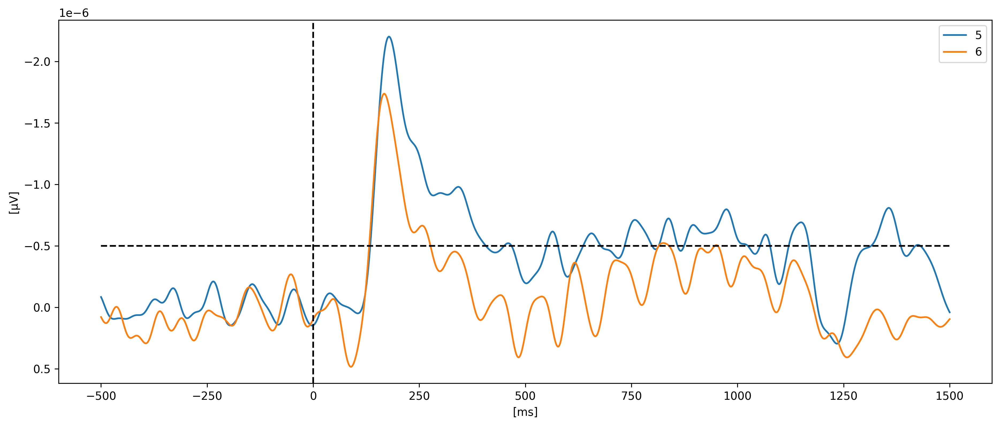

In [7]:
plt.figure(figsize=(15, 6), dpi=300)
plt.plot(times * 1000, (cda_all[15].mean(0) + cda_all[25].mean(0)) / 2, label='5')
plt.plot(times * 1000, (cda_all[16].mean(0) + cda_all[26].mean(0)) / 2, label='6')

plt.axvline(x=0, color='k', linestyle='--')
plt.plot(times * 1000, [-0.5*10e-7]*len(times), color='k', linestyle='--')
plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[ms]')
#plt.savefig("./img/Gunseli-2019_CDA-reprod.jpg", dpi=300)

## The difference between the paper and the graph below:
#1 - No subject rejected here.  (only 1 above, removed from the 15-25)
#2 - No artifact removal!
#3 - No Channel interpolation for noisy channel.
#4 - Not a 6Hz Low Pass filter at for their final graph.

# New Gunseli

In [8]:
with open("cda_gunseli2019-new.pkl","rb") as f:
    cda_dict = pickle.load(f)

times = cda_dict['times']
del cda_dict['times']

print("Participants: {}, Conditions: {}". format(len(cda_dict), cda_dict[list(cda_dict.keys())[0]].keys()))

Participants: 30, Conditions: dict_keys(['5', '6'])


In [10]:
cda_all = dict()

for cond in cda_dict[list(cda_dict.keys())[0]].keys():
    cda_all[cond] = dict()

    for f in cda_dict.keys():
        ## ====== Manual Cleanup ========
        # Skip pp11.set
        if f == 'StratAtt_e2_LoadChans_pp11.set':
            continue
        
        perf = 'good'
        ldict = cda_dict[f][cond]['left']
        rdict = cda_dict[f][cond]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):
            cda_dict_cur = (cda_dict[f][cond]['left']['good'] + cda_dict[f][cond]['right']['good'])/2
            cda_all[cond] = np.vstack([cda_all[cond], cda_dict_cur]) if len(cda_all[cond]) else cda_dict_cur
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))
            
        #print("Processing CDA ({}): {}-{} = {}, {}-{} = {}".format(f, cond, 'left', len(ldict), cond, 'right', len(rdict)))

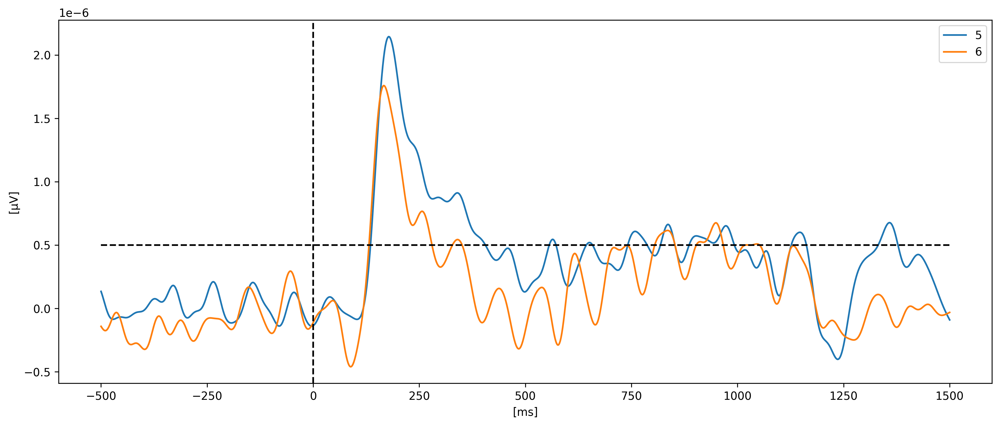

In [12]:
plt.figure(figsize=(15, 6), dpi=300)
plt.plot(times * 1000, cda_all['5'].mean(0), label='5')
plt.plot(times * 1000, cda_all['6'].mean(0), label='6')

plt.axvline(x=0, color='k', linestyle='--')
plt.plot(times * 1000, [0.5*10e-7]*len(times), color='k', linestyle='--')
#plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[ms]')
plt.show()
#plt.savefig("./img/Gunseli-2019_CDA-reprod.jpg", dpi=300)

## The difference between the paper and the graph below:
#1 - No subject rejected here.  (only 1 above, removed from the 15-25)
#2 - No artifact removal!
#3 - No Channel interpolation for noisy channel.
#4 - Not a 6Hz Low Pass filter at for their final graph.

# Head to Head - Subject by Subject!

In [29]:
# ------------------------------------------------------
# Loading NEW Gunseli...
# ------------------------------------------------------
print("----------------------------------")
print("NEW GUNSELI")
print("----------------------------------")
with open("cda_gunseli2019-new.pkl","rb") as f:
    cda_dict = pickle.load(f)

times = cda_dict['times']
del cda_dict['times']

print("Participants: {}, Conditions: {}". format(len(cda_dict), cda_dict[list(cda_dict.keys())[0]].keys()))

cda_all_new = dict()
i = 0
for cond in cda_dict[list(cda_dict.keys())[0]].keys():
    cda_all_new[cond] = dict()

    for f in cda_dict.keys():
        ## ====== Manual Cleanup ========
        # Skip pp11.set
        if f == 'StratAtt_e2_LoadChans_pp11.set' or f == 'StratAtt_e2_LoadChans_pp24.set' or f == 'StratAtt_e2_LoadChans_pp18.set':
            continue
        
        perf = 'good'
        ldict = cda_dict[f][cond]['left']
        rdict = cda_dict[f][cond]['right']
        if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):
            #if not (cond == '5' and f == 'StratAtt_e2_LoadChans_pp24.set'):
            cda_dict_cur = (cda_dict[f][cond]['left']['good'] + cda_dict[f][cond]['right']['good'])/2
            cda_all_new[cond] = np.vstack([cda_all_new[cond], cda_dict_cur]) if len(cda_all_new[cond]) else cda_dict_cur
                #if i == 22:
                #    print('file: \t{}'.format(f))
                #i = i + 1
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))
            
        #print("Processing CDA ({}): {}-{} = {}, {}-{} = {}".format(f, cond, 'left', len(ldict), cond, 'right', len(rdict)))
        print(f)
        
# ------------------------------------------------------
# Loading OLD Gunseli...
# ------------------------------------------------------
print("----------------------------------")
print("OLD GUNSELI")
print("----------------------------------")
with open("cda_gunseli2019-old.pkl","rb") as f:
    cda_dict = pickle.load(f)

times = cda_dict['times']
del cda_dict['times']

cda_all_old = dict()

i = 0
for t in cda_dict[list(cda_dict.keys())[0]].keys():
    cda_all_old[t] = None

    for f in cda_dict.keys():
        if f == 'StratAtt_e2_LoadChans_pp11.set' or f == 'StratAtt_e2_LoadChans_pp24.set' or f == 'StratAtt_e2_LoadChans_pp18.set':
            continue
        if len(cda_dict[f][t]) > 0:
            if cda_all_old[t] is None:
                cda_all_old[t] =  cda_dict[f][t]
            else:
                cda_all_old[t] = np.vstack([cda_all_old[t], cda_dict[f][t]])
            
            #if i == 22:
            #    print('file: \t{}'.format(f))
            #i = i + 1
        else:
            print("==== SKIPPED: 0 points! (File: {} - Trigger: {})".format(str(f), str(t)))
        
        print(f)

----------------------------------
NEW GUNSELI
----------------------------------
Participants: 30, Conditions: dict_keys(['5', '6'])
StratAtt_e2_LoadChans_pp2.set
StratAtt_e2_LoadChans_pp3.set
StratAtt_e2_LoadChans_pp4.set
StratAtt_e2_LoadChans_pp5.set
StratAtt_e2_LoadChans_pp7.set
StratAtt_e2_LoadChans_pp6.set
StratAtt_e2_LoadChans_pp13.set
StratAtt_e2_LoadChans_pp12.set
StratAtt_e2_LoadChans_pp10.set
StratAtt_e2_LoadChans_pp15.set
StratAtt_e2_LoadChans_pp29.set
StratAtt_e2_LoadChans_pp28.set
StratAtt_e2_LoadChans_pp14.set
StratAtt_e2_LoadChans_pp16.set
StratAtt_e2_LoadChans_pp17.set
StratAtt_e2_LoadChans_pp32.set
StratAtt_e2_LoadChans_pp26.set
StratAtt_e2_LoadChans_pp33.set
StratAtt_e2_LoadChans_pp19.set
StratAtt_e2_LoadChans_pp25.set
StratAtt_e2_LoadChans_pp31.set
StratAtt_e2_LoadChans_pp30.set
StratAtt_e2_LoadChans_pp21.set
StratAtt_e2_LoadChans_pp23.set
StratAtt_e2_LoadChans_pp22.set
StratAtt_e2_LoadChans_pp8.set
StratAtt_e2_LoadChans_pp9.set
StratAtt_e2_LoadChans_pp2.set
StratAt

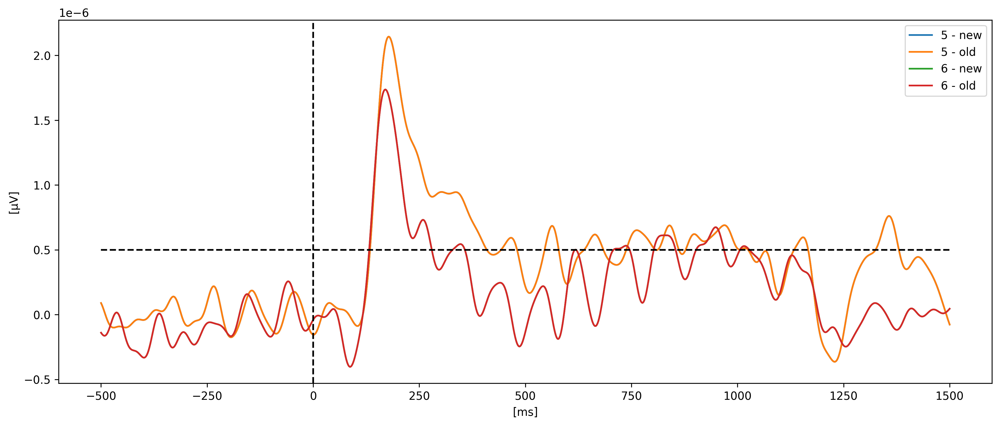

In [32]:
plt.figure(figsize=(15, 6), dpi=300)
plt.plot(times * 1000, cda_all_new['5'].mean(0), label='5 - new')
plt.plot(times * 1000, (cda_all_old[15].mean(0) + cda_all_old[25].mean(0)) / -2, label='5 - old')
plt.plot(times * 1000, cda_all_new['6'].mean(0), label='6 - new')
plt.plot(times * 1000, (cda_all_old[16].mean(0) + cda_all_old[26].mean(0)) / -2, label='6 - old')

plt.axvline(x=0, color='k', linestyle='--')
plt.plot(times * 1000, [0.5*10e-7]*len(times), color='k', linestyle='--')
#plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[ms]')
plt.show()

In [24]:
print(len(cda_all_new['6']))
print(len(cda_all_old[26]))

29
29


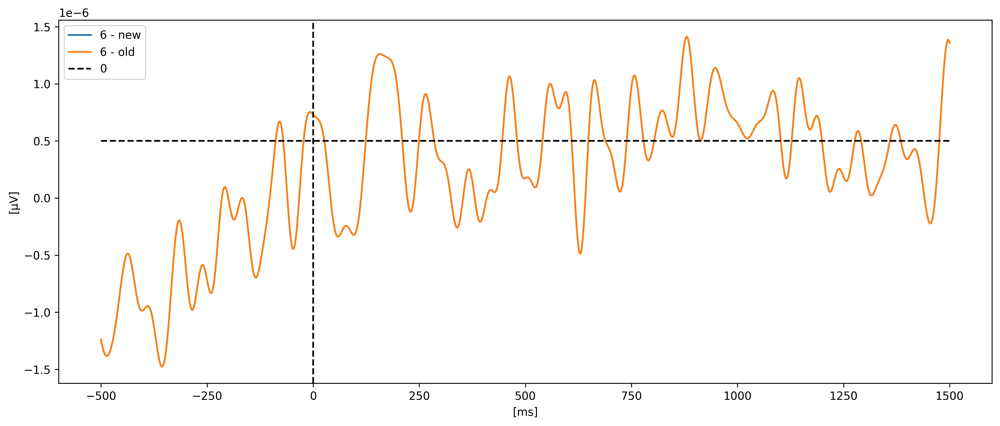

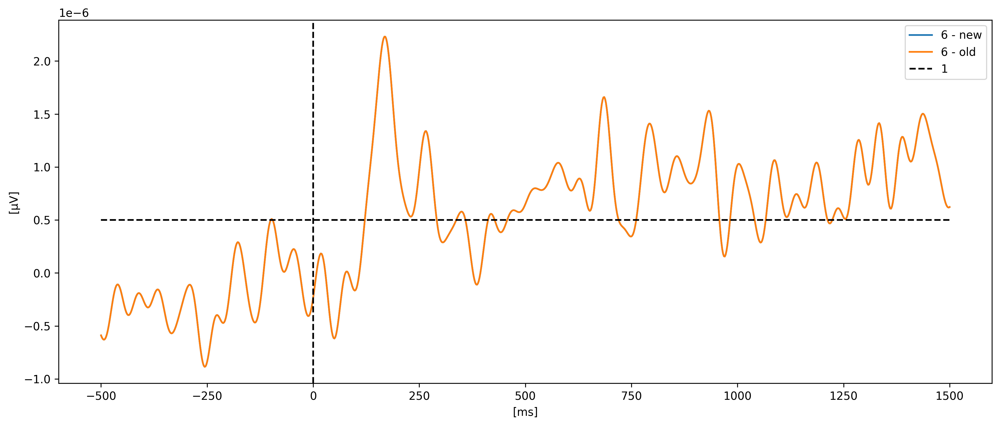

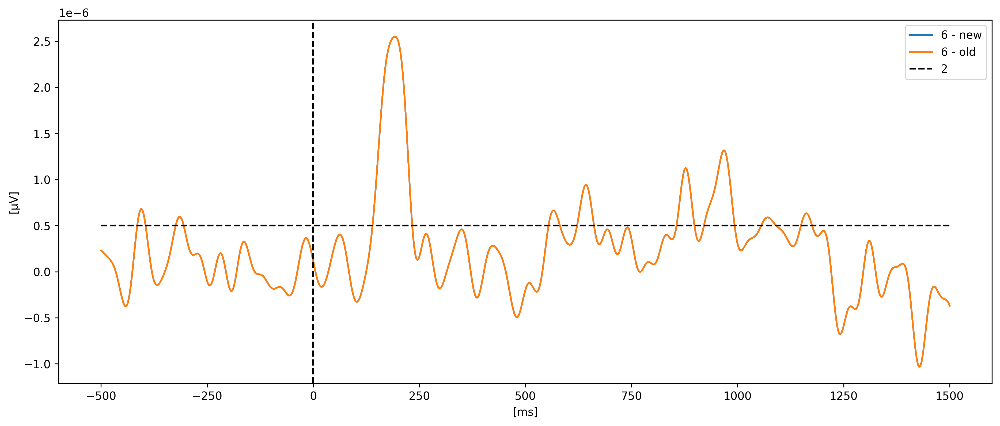

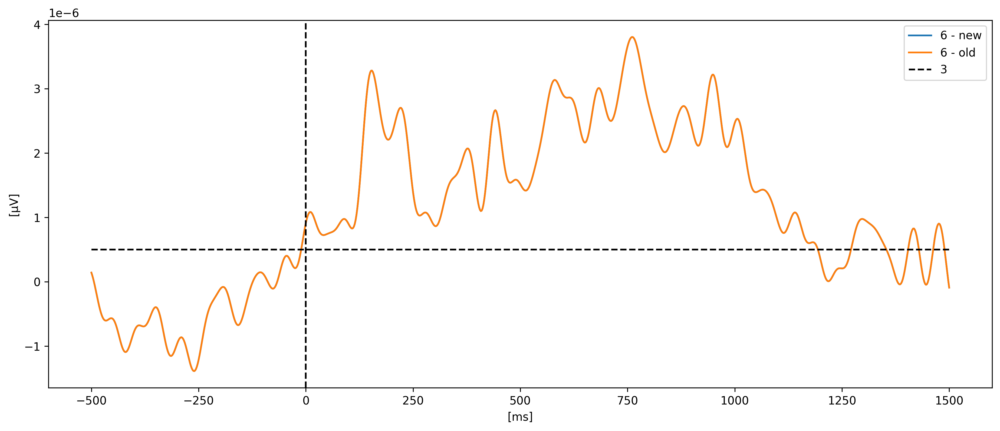

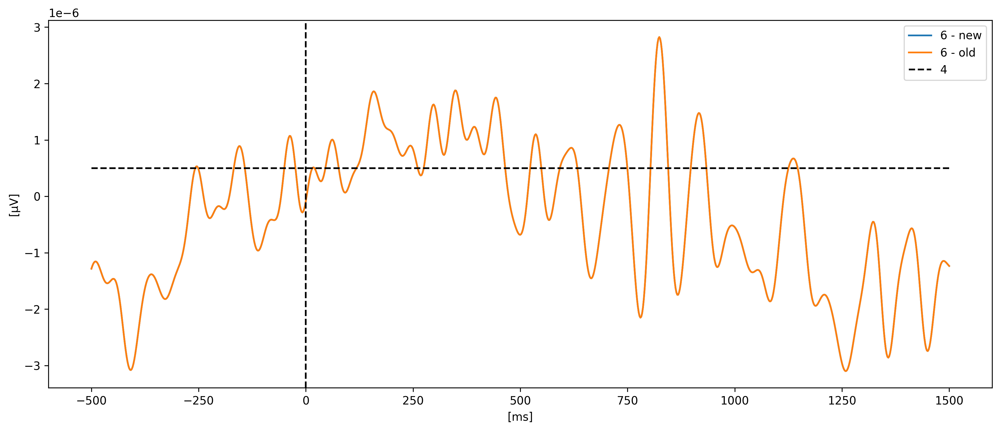

...

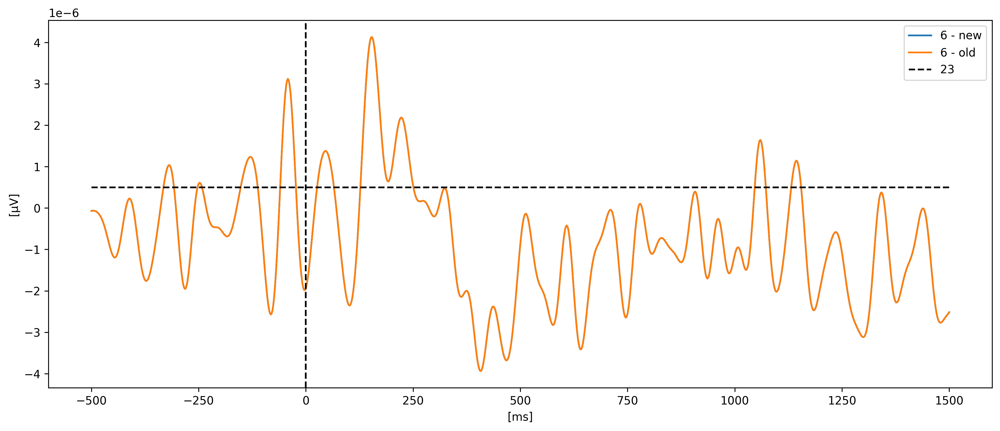

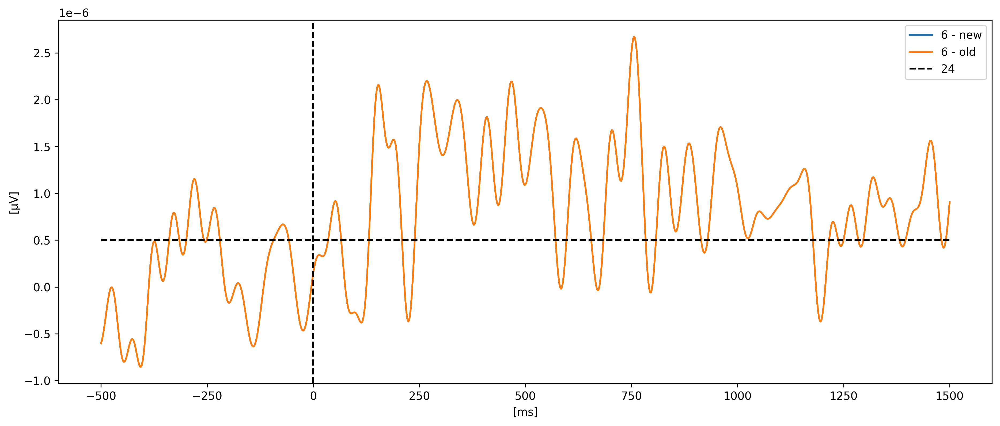

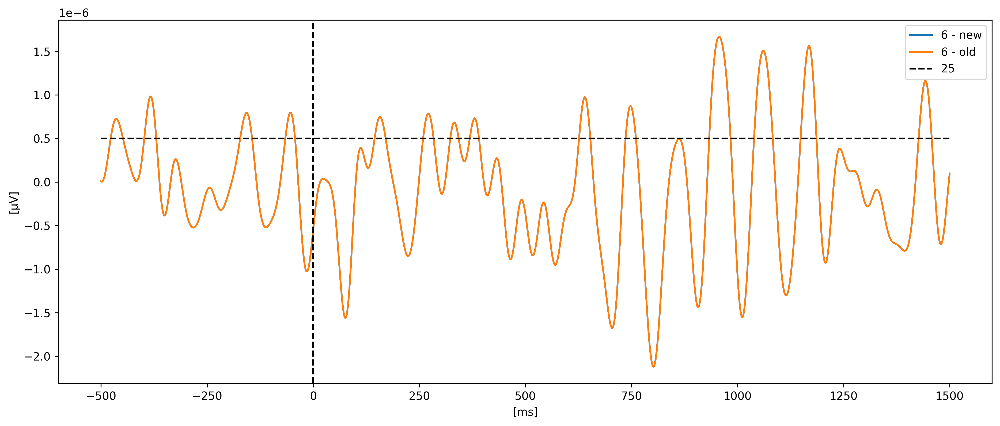

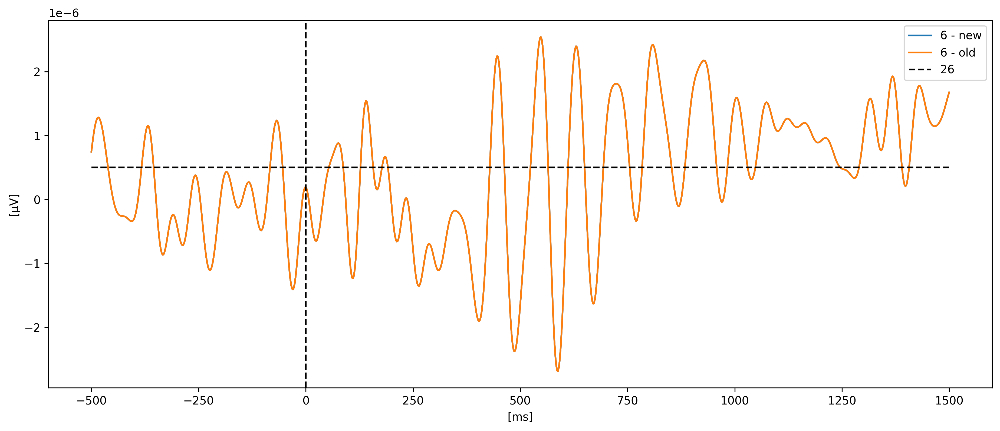

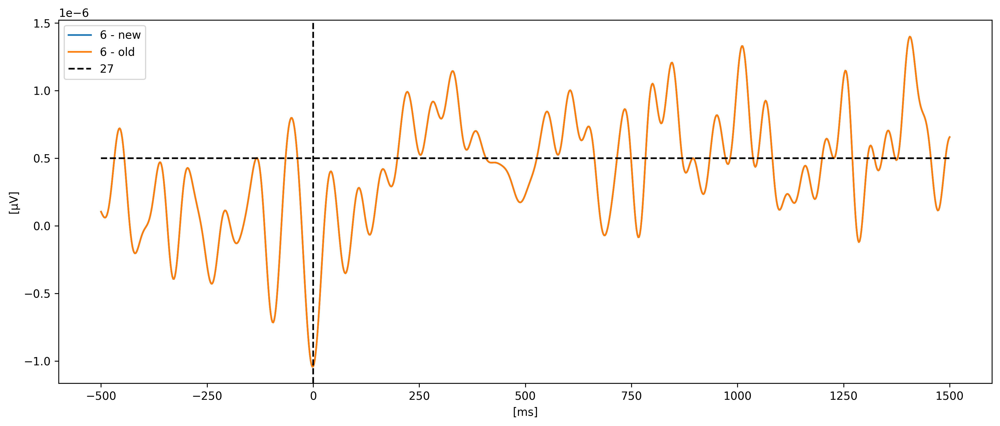

In [25]:
for i in range(len(cda_all_new['5'])): 
    plt.figure(figsize=(15, 6), dpi=300)
    plt.plot(times * 1000, cda_all_new['6'][i], label='6 - new')
    plt.plot(times * 1000, (cda_all_old[16][i] + cda_all_old[26][i]) / -2, label='6 - old')

    plt.axvline(x=0, color='k', linestyle='--')
    plt.plot(times * 1000, [0.5*10e-7]*len(times), color='k', linestyle='--', label='{}'.format(i))
    #plt.gca().invert_yaxis()
    plt.legend()
    plt.ylabel('[μV]')
    plt.xlabel('[ms]')
    plt.show()